In [8]:
#코로나로 중국인 관광객이 얼마나 줄었을까?
import pandas as pd 

kto_201901 = pd.read_excel('c:\work\kto_201901.xlsx',
    header=1, usecols='A:G', skipfooter=4)

kto_201901.head()

,국적,관광,상용,공용,유학/연수,기타,계
0,아시아주,765082,10837,1423,14087,125521,916950
1,일본,198805,2233,127,785,4576,206526
2,대만,86393,74,22,180,1285,87954
3,홍콩,34653,59,2,90,1092,35896
4,마카오,2506,2,0,17,45,2570


In [9]:
#데이터 전처리
#먼저 정보를 확인한다.
kto_201901.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67 entries, 0 to 66
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   국적      67 non-null     object
 1   관광      67 non-null     int64 
 2   상용      67 non-null     int64 
 3   공용      67 non-null     int64 
 4   유학/연수   67 non-null     int64 
 5   기타      67 non-null     int64 
 6   계       67 non-null     int64 
dtypes: int64(6), object(1)
memory usage: 3.8+ KB


In [10]:
#관광목적으로 많이 온다. 
kto_201901.describe()

,관광,상용,공용,유학/연수,기타,계
count,67.00000,67.000000,67.000000,67.000000,67.000000,67.000000
mean,26396.80597,408.208955,132.507463,477.462687,5564.208955,32979.194030
std,102954.04969,1416.040302,474.406339,2009.484800,17209.438418,122821.369969
min,0.00000,0.000000,0.000000,0.000000,16.000000,54.000000
25%,505.00000,14.500000,2.500000,17.500000,260.000000,927.000000
50%,1304.00000,45.000000,14.000000,43.000000,912.000000,2695.000000
75%,8365.00000,176.500000,38.000000,182.000000,2824.500000,14905.500000
max,765082.00000,10837.000000,2657.000000,14087.000000,125521.000000,916950.000000


In [11]:

#관광, 상용, 공용, 유학/연수에서 최소값(min)이 0인것을 볼 수 있다.
#0으로 입력된 데이터는 어떤 경우인지 확인해 본다.
#condition = (kto_201901['관광'] == 0) 
#광, 상용, 공용, 유학/연수에서 최소값(min)이 0인것을 볼 수 있다.
#0으로 입력된 데이터는 어떤 경우인지 확인해 본다.
condition = (kto_201901['관광'] == 0) \
    | (kto_201901['상용'] == 0) \
    | (kto_201901['공용'] == 0) \
    | (kto_201901['유학/연수'] == 0)

kto_201901[condition]
#교포소개와 교포만 4개 컬럼이 모두 0인것을 확인할 수 있다. 
#이는 교포는 통계집계 시 기타 목적으로 분류돼 있기 때문이다. 

,국적,관광,상용,공용,유학/연수,기타,계
4,마카오,2506,2,0,17,45,2570
20,이스라엘,727,12,0,9,57,805
22,우즈베키스탄,1958,561,0,407,2828,5754
38,스위스,613,18,0,19,97,747
45,그리스,481,17,4,0,273,775
46,포르투갈,416,14,0,13,121,564
51,크로아티아,226,12,0,3,250,491
54,폴란드,713,10,0,27,574,1324
59,대양주 기타,555,3,4,0,52,614
63,기타대륙,33,4,0,1,16,54


In [12]:
#데이터프렝미에 기준연월 추가
#현재 활용하는 데이터는 2019년 1월 데이터이다. 2010년 1월부터 2019년 12월까지의
#데이터를 활용할 예정이기 때문에 각 데이터마다 기준년월 정보가 필요하다. 
kto_201901['기준월일'] = '2019-01'
kto_201901.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일
0,아시아주,765082,10837,1423,14087,125521,916950,2019-01
1,일본,198805,2233,127,785,4576,206526,2019-01
2,대만,86393,74,22,180,1285,87954,2019-01
3,홍콩,34653,59,2,90,1092,35896,2019-01
4,마카오,2506,2,0,17,45,2570,2019-01


In [13]:
#국적 데이너만 남기기 
#국적 컬럼에 어떤 항목들이 있는지 살펴본다.
kto_201901['국적'].unique()

array(['아시아주', '일본', '대만', '홍콩', '마카오', '태국', '말레이시아', '필리핀', '인도네시아',
       '싱가포르', '미얀마', '베트남', '인도', '스리랑카', '파키스탄', '방글라데시', '캄보디아', '몽골',
       '중국', '이란', '이스라엘', '터키', '우즈베키스탄', '카자흐스탄', 'GCC', '아시아 기타', '미주',
       '미국', '캐나다', '멕시코', '브라질', '미주 기타', '구주', '영국', '독일', '프랑스',
       '네덜란드', '스웨덴', '스위스', '이탈리아', '덴마크', '노르웨이', '벨기에', '오스트리아', '스페인',
       '그리스', '포르투갈', '핀란드', '아일랜드', '우크라이나', '러시아', '크로아티아', '루마니아',
       '불가리아', '폴란드', '구주 기타', '대양주', '오스트레일리아', '뉴질랜드', '대양주 기타',
       '아프리카주', '남아프리카공화국', '아프리카 기타', '기타대륙', '국적미상', '교포소계', '교포'],
      dtype=object)

In [14]:
#국적 컬럼에는 '아시아주','일본','대만'과 같이 대륙과 국가가 훈용된 것을 확인할 수 있습니다. 
#하나의 컬럼에는 하나의 특징을 가진 값들이 들어있어야 분석이 용이하.ㄷ
#따라서 국적 컬럼에 국가만 남기는 작업을 한다. 
#확인해보면 총 7개의 값(아시아주,미주,구주,대양주,아프리카주,기타대륙,교포소게)가
#국가 레벨이 아닌 대륙 레벨인 것을 알 수 있다. 
#이7개의 값을 continents_list,.로 만들어 본다.ㅣ 
continents_list = ['아시아주','미주','대양주','아프리카주','기타대륙','교포소계']
continents_list

['아시아주', '미주', '대양주', '아프리카주', '기타대륙', '교포소계']

In [15]:


#대륙 목록에 해당하는 값 제외
condition = (kto_201901.국적.isin(continents_list) == False)
kto_201901_country = kto_201901[condition]
kto_201901_country['국적'].unique()

array(['일본', '대만', '홍콩', '마카오', '태국', '말레이시아', '필리핀', '인도네시아', '싱가포르',
       '미얀마', '베트남', '인도', '스리랑카', '파키스탄', '방글라데시', '캄보디아', '몽골', '중국',
       '이란', '이스라엘', '터키', '우즈베키스탄', '카자흐스탄', 'GCC', '아시아 기타', '미국',
       '캐나다', '멕시코', '브라질', '미주 기타', '구주', '영국', '독일', '프랑스', '네덜란드',
       '스웨덴', '스위스', '이탈리아', '덴마크', '노르웨이', '벨기에', '오스트리아', '스페인', '그리스',
       '포르투갈', '핀란드', '아일랜드', '우크라이나', '러시아', '크로아티아', '루마니아', '불가리아',
       '폴란드', '구주 기타', '오스트레일리아', '뉴질랜드', '대양주 기타', '남아프리카공화국', '아프리카 기타',
       '국적미상', '교포'], dtype=object)

In [16]:
#출력결과, 국적 컬럼에 국가명만 남게 된 것을 확인할 수 있다. 
kto_201901_country.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일
1,일본,198805,2233,127,785,4576,206526,2019-01
2,대만,86393,74,22,180,1285,87954,2019-01
3,홍콩,34653,59,2,90,1092,35896,2019-01
4,마카오,2506,2,0,17,45,2570,2019-01
5,태국,34004,37,199,96,6998,41334,2019-01


In [17]:
#데이터를 필터링하다 보면 인덱스 값이 누락되는 경우가 발생한다. 
#이런 경우 인덱스 값을 초기화 하는 것이 좋다. 
kto_201901_country_newindex = kto_201901_country.reset_index(drop = True)
kto_201901_country_newindex.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일
0,일본,198805,2233,127,785,4576,206526,2019-01
1,대만,86393,74,22,180,1285,87954,2019-01
2,홍콩,34653,59,2,90,1092,35896,2019-01
3,마카오,2506,2,0,17,45,2570,2019-01
4,태국,34004,37,199,96,6998,41334,2019-01


In [18]:
#대륙컬럼 만들기 
#각 국가들이 어떤 대륙에 속하는지에 대한 정보도 가지고 있으면 데이터 분석에 도움이 된다. 
#아시아주에는 25개국(일본, 대만, 홍콩....)
#미주에는 5개국
#유럽(구주)는 23개국 
# 오세아니아(대양주) 3개국
# 아프리카주 2개국
# 기타대륙(1개)
# 교포소계 1개 
continents = ['아시아'] * 25 + ['아메리카'] * 5 + ['유럽'] * 23 \
    + ['오세아니아'] * 3 + ['아프리카'] * 2 + ['기타대륙'] + ['교포'] * 2 
continents 

['아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아시아',
 '아메리카',
 '아메리카',
 '아메리카',
 '아메리카',
 '아메리카',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '유럽',
 '오세아니아',
 '오세아니아',
 '오세아니아',
 '아프리카',
 '아프리카',
 '기타대륙',
 '교포',
 '교포']

In [19]:
#대륙 컬럼 생성
kto_201901_country_newindex['대륙'] = continents
kto_201901_country_newindex.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일,대륙
0,일본,198805,2233,127,785,4576,206526,2019-01,아시아
1,대만,86393,74,22,180,1285,87954,2019-01,아시아
2,홍콩,34653,59,2,90,1092,35896,2019-01,아시아
3,마카오,2506,2,0,17,45,2570,2019-01,아시아
4,태국,34004,37,199,96,6998,41334,2019-01,아시아


In [20]:
kto_201901_country_newindex.tail()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일,대륙
56,대양주 기타,555,3,4,0,52,614,2019-01,아프리카
57,남아프리카공화국,368,9,1,6,616,1000,2019-01,아프리카
58,아프리카 기타,768,718,90,206,908,2690,2019-01,기타대륙
59,국적미상,33,4,0,1,16,54,2019-01,교포
60,교포,0,0,0,0,15526,15526,2019-01,교포


In [21]:
#국적별 관광객 비율 살펴보기 
#국적별로 관광객 수를 전체 입국자 수로 나눈 컬럼으 만들어 본다. 
#소수점 첫번째 자리에서 반올름을 하기 위해서 round()함수를 사용했다.
kto_201901_country_newindex['관광객비율'] = \
    round(kto_201901_country_newindex['관광'] / kto_201901_country_newindex['계'] * 100, 1)
kto_201901_country_newindex.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일,대륙,관광객비율
0,일본,198805,2233,127,785,4576,206526,2019-01,아시아,96.3
1,대만,86393,74,22,180,1285,87954,2019-01,아시아,98.2
2,홍콩,34653,59,2,90,1092,35896,2019-01,아시아,96.5
3,마카오,2506,2,0,17,45,2570,2019-01,아시아,97.5
4,태국,34004,37,199,96,6998,41334,2019-01,아시아,82.3


In [22]:
#관광객 비율이 높은 국가 상위 5개국 
kto_201901_country_newindex.sort_values(by = '관광객비율', ascending=False).head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일,대륙,관광객비율
1,대만,86393,74,22,180,1285,87954,2019-01,아시아,98.2
3,마카오,2506,2,0,17,45,2570,2019-01,아시아,97.5
2,홍콩,34653,59,2,90,1092,35896,2019-01,아시아,96.5
0,일본,198805,2233,127,785,4576,206526,2019-01,아시아,96.3
56,대양주 기타,555,3,4,0,52,614,2019-01,아프리카,90.4


In [23]:
#관광객 비율이 낮은 국가 상위 5개국 
#교포, 방긍라데시,스리랑카등은 관광 목적의 비율이 떨어지는 것을 볼 수 있다. 
kto_201901_country_newindex.sort_values(by = '관광객비율', ascending=True).head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일,대륙,관광객비율
60,교포,0,0,0,0,15526,15526,2019-01,교포,0.0
14,방글라데시,149,126,27,97,848,1247,2019-01,아시아,11.9
12,스리랑카,157,54,5,28,1043,1287,2019-01,아시아,12.2
13,파키스탄,238,178,10,193,413,1032,2019-01,아시아,23.1
15,캄보디아,635,39,55,51,1915,2695,2019-01,아시아,23.6


In [24]:
#피봇 함수를 사용한다.
#오세아니아가 관광객 비율이 높은 것을 볼 수 있다. 
kto_201901_country_newindex.pivot_table(values = '관광객비율', index='대륙',
    aggfunc='mean')

,관광객비율
대륙,
교포,30.550000
기타대륙,28.600000
아메리카,68.200000
아시아,59.624000
아프리카,63.600000
오세아니아,75.033333
유럽,64.134783


In [31]:
#중국 국적만 필터링을 한다.
condition = (kto_201901_country_newindex['국적'] == '중국')
if condition.count() > 0:
    print("데이터 있음")
else:
    print("데이터 없음")

print(kto_201901_country_newindex[condition])

데이터 있음
    국적      관광    상용   공용  유학/연수     기타       계     기준월일   대륙  관광객비율  전체비율
17  중국  320113  2993  138   8793  60777  392814  2019-01  아시아   81.5  34.3


In [26]:
#기준년월별로 전체 외국인 관광객 대비 국적별 관광객 비율 살펴보기 
tourist_sum = sum(kto_201901_country_newindex['관광'])
tourist_sum


931974

In [27]:
#국적별 외국인 관광객 수를 이 합계로 나누면 국가별로 전체 외국인 
#관광객 대비 차지하는 비율을 구할 수 있다. 
kto_201901_country_newindex['전체비율']  = \
    round(kto_201901_country_newindex['관광'] / tourist_sum * 100, 1)
kto_201901_country_newindex.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일,대륙,관광객비율,전체비율
0,일본,198805,2233,127,785,4576,206526,2019-01,아시아,96.3,21.3
1,대만,86393,74,22,180,1285,87954,2019-01,아시아,98.2,9.3
2,홍콩,34653,59,2,90,1092,35896,2019-01,아시아,96.5,3.7
3,마카오,2506,2,0,17,45,2570,2019-01,아시아,97.5,0.3
4,태국,34004,37,199,96,6998,41334,2019-01,아시아,82.3,3.6


In [28]:
#전체비율 컬럼을 통해 우리나라를 방문하는 외국인 관광객 비율이 높은 상위 5개국과 비율을 본다.
kto_201901_country_newindex.sort_values('전체비율', ascending=False).head()

,국적,관광,상용,공용,유학/연수,기타,계,기준월일,대륙,관광객비율,전체비율
17,중국,320113,2993,138,8793,60777,392814,2019-01,아시아,81.5,34.3
0,일본,198805,2233,127,785,4576,206526,2019-01,아시아,96.3,21.3
1,대만,86393,74,22,180,1285,87954,2019-01,아시아,98.2,9.3
30,구주,47681,1465,230,1177,19485,70038,2019-01,유럽,68.1,5.1
25,미국,42989,418,2578,229,16523,62737,2019-01,아메리카,68.5,4.6


In [29]:
#데이터 전처리 과정을 함수로 만들기 
#예제 4-23 create_kto_data 함수 생성
def create_kto_data(yy, mm):  
    #1. 불러올 Excel 파일 경로를 지정
    file_path = 'c:\work\kto_{}{}.xlsx'.format(yy, mm)  
    
    # 2. Excel 파일 불러오기 
    df = pd.read_excel(file_path, header=1, skipfooter=4, usecols='A:G')
    
    # 3. "기준년월" 컬럼 추가 
    df['기준년월'] = '{}-{}'.format(yy, mm) 
    
    # 4. "국적" 컬럼에서 대륙 제거하고 국가만 남기기 
    ignore_list = ['아시아주', '미주', '구주', '대양주', '아프리카주', '기타대륙', '교포소계']       # 제거할 대륙명 선정하기 
    condition = (df['국적'].isin(ignore_list) == False)    # 대륙 미포함 조건 
    df_country = df[condition].reset_index(drop=True) 
    
    # 5. "대륙" 컬럼 추가 
    continents = ['아시아']*25 + ['아메리카']*5 + ['유럽']*23 + ['대양주']*3 + ['아프리카']*2 +          ['기타대륙'] + ['교포']    # 대륙 컬럼 생성을 위한 목록 만들어 놓기 
    df_country['대륙'] = continents   
                       
    # 6. 국가별 "관광객비율(%)" 컬럼 추가
    df_country['관광객비율(%)'] = round(df_country.관광 / df_country.계 * 100, 1) 
                       
    # 7. "전체비율(%)" 컬럼 추가
    tourist_sum = sum(df_country['관광'])
    df_country['전체비율(%)'] = round(df_country['관광'] / tourist_sum * 100, 1)
    
    # 8. 결과 출력
    return(df_country)


In [30]:
#create_kto_data()함수를 활용해 2018년 12월 데이터 로딩하기
import pandas as pd 
kto_test = create_kto_data(2018, 12)
kto_test.head()

FileNotFoundError: [Errno 2] No such file or directory: 'c:\\work\\kto_201812.xlsx'

In [ ]:
#이중 반복문으로 기준년월 출력
for yy in range(2010, 2020):
    for mm in range(1,13):
        yymm = '{}{}'.format(yy, mm)
        print(yymm)

20101
20102
20103
20104
20105
20106
20107
20108
20109
201010
201011
201012
20111
20112
20113
20114
20115
20116
20117
20118
20119
201110
201111
201112
20121
20122
20123
20124
20125
20126
20127
20128
20129
201210
201211
201212
20131
20132
20133
20134
20135
20136
20137
20138
20139
201310
201311
201312
20141
20142
20143
20144
20145
20146
20147
20148
20149
201410
201411
201412
20151
20152
20153
20154
20155
20156
20157
20158
20159
201510
201511
201512
20161
20162
20163
20164
20165
20166
20167
20168
20169
201610
201611
201612
20171
20172
20173
20174
20175
20176
20177
20178
20179
201710
201711
201712
20181
20182
20183
20184
20185
20186
20187
20188
20189
201810
201811
201812
20191
20192
20193
20194
20195
20196
20197
20198
20199
201910
201911
201912


In [ ]:
# 6 자리로 정렬해서 기준년월 출력하기
for yy in range(2010, 2020):
    for mm in range(1,13):
        mm_str = str(mm).zfill(2)
        yymm = '{}{}'.format(yy,mm_str)
        print(yymm)

201001
201002
201003
201004
201005
201006
201007
201008
201009
201010
201011
201012
201101
201102
201103
201104
201105
201106
201107
201108
201109
201110
201111
201112
201201
201202
201203
201204
201205
201206
201207
201208
201209
201210
201211
201212
201301
201302
201303
201304
201305
201306
201307
201308
201309
201310
201311
201312
201401
201402
201403
201404
201405
201406
201407
201408
201409
201410
201411
201412
201501
201502
201503
201504
201505
201506
201507
201508
201509
201510
201511
201512
201601
201602
201603
201604
201605
201606
201607
201608
201609
201610
201611
201612
201701
201702
201703
201704
201705
201706
201707
201708
201709
201710
201711
201712
201801
201802
201803
201804
201805
201806
201807
201808
201809
201810
201811
201812
201901
201902
201903
201904
201905
201906
201907
201908
201909
201910
201911
201912


In [ ]:
#데이터를 담을 빈 데이터프레임을 만들고 
#년월 데이터 전체를 합치기
df = pd.DataFrame()
for yy in range(2010,2021):
    for mm in range(1,13):
        temp = create_kto_data(str(yy), str(mm).zfill(2))
        df = df.append(temp, ignore_index=True)

#2020년 5월까지만 있어서 중간에 에러나 나지만 정상적으로 그 이전 데이터는 첨부가 된다.  

FileNotFoundError: [Errno 2] No such file or directory: 'c:\\work\\kto_202006.xlsx'

In [ ]:
df.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%)
0,일본,202825,1750,89,549,3971,209184,2010-01,아시아,97.0,50.6
1,대만,35788,41,17,37,516,36399,2010-01,아시아,98.3,8.9
2,홍콩,13874,55,0,21,595,14545,2010-01,아시아,95.4,3.5
3,마카오,554,0,0,0,0,554,2010-01,아시아,100.0,0.1
4,태국,13374,39,13,53,4335,17814,2010-01,아시아,75.1,3.3


In [ ]:
df.tail()

,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%)
7495,대양주 기타,1,0,1,0,3,5,2020-05,대양주,20.0,0.0
7496,남아프리카공화국,1,0,3,0,25,29,2020-05,아프리카,3.4,0.0
7497,아프리카 기타,3,1,3,6,118,131,2020-05,아프리카,2.3,0.0
7498,국적미상,1,0,0,0,3,4,2020-05,기타대륙,25.0,0.0
7499,교포,0,0,0,0,790,790,2020-05,교포,0.0,0.0


In [ ]:
#오류 발생을 처리하려면 try except 사용
#데이터를 담을 빈 데이터프레임을 만들고 
#년월 데이터 전체를 합치기
df = pd.DataFrame()
for yy in range(2010,2021):
    for mm in range(1,13):
        try:
            temp = create_kto_data(str(yy), str(mm).zfill(2))
            df = df.append(temp, ignore_index=True)
        except:
            pass 

        

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   국적        7500 non-null   object 
 1   관광        7500 non-null   int64  
 2   상용        7500 non-null   int64  
 3   공용        7500 non-null   int64  
 4   유학/연수     7500 non-null   int64  
 5   기타        7500 non-null   int64  
 6   계         7500 non-null   int64  
 7   기준년월      7500 non-null   object 
 8   대륙        7500 non-null   object 
 9   관광객비율(%)  7500 non-null   float64
 10  전체비율(%)   7500 non-null   float64
dtypes: float64(2), int64(6), object(3)
memory usage: 556.7+ KB


In [ ]:
#통합 데이터를 엑셀 파일로 저장하기
df.to_excel('c:\work\kto_total.xlsx', index=False)


In [ ]:
#국적별로 필터링 된 데이터를 엑셀에 담기 
condition = (df['국적'] == '중국')
df_filter = df[condition]
df_filter.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%)
17,중국,40425,11930,55,2751,36091,91252,2010-01,아시아,44.3,10.1
77,중국,60590,7907,68,29546,42460,140571,2010-02,아시아,43.1,13.6
137,중국,50330,13549,174,14924,62480,141457,2010-03,아시아,35.6,9.2
197,중국,84252,13306,212,2199,47711,147680,2010-04,아시아,57.1,15.5
257,중국,89056,12325,360,2931,49394,154066,2010-05,아시아,57.8,17.0


In [ ]:
#중국인 관광객 파일로 저장
file_path = 'c:\work\국적별_관광객_중국.xlsx'
df_filter.to_excel(file_path, index=False)

In [ ]:
#국적 리스트 만들기
cntry_list = df['국적'].unique()
cntry_list

array(['일본', '대만', '홍콩', '마카오', '태국', '말레이시아', '필리핀', '인도네시아', '싱가포르',
       '미얀마', '베트남', '인도', '스리랑카', '파키스탄', '방글라데시', '캄보디아', '몽골', '중국',
       '이란', '이스라엘', '터키', '우즈베키스탄', '카자흐스탄', 'GCC', '아시아 기타', '미국',
       '캐나다', '멕시코', '브라질', '미주 기타', '영국', '독일', '프랑스', '네덜란드', '스웨덴',
       '스위스', '이탈리아', '덴마크', '노르웨이', '벨기에', '오스트리아', '스페인', '그리스', '포르투갈',
       '핀란드', '아일랜드', '우크라이나', '러시아', '크로아티아', '루마니아', '불가리아', '폴란드',
       '구주 기타', '오스트레일리아', '뉴질랜드', '대양주 기타', '남아프리카공화국', '아프리카 기타',
       '국적미상', '교포'], dtype=object)

In [ ]:
#국적의 갯수
len(cntry_list)

60

In [ ]:
#개별 국적별 관광객 데이터 저장하기
for cntry in cntry_list: 
    # 국적으로 필터링 
    condition = (df['국적'] == cntry)
    df_filter = df[condition]
    
    # 국적이름을 반영한 파일명 만들기 
    file_path = 'c:\\work\\[국적별 관광객 데이터] {}.xlsx'.format(cntry)
    
    # 정해 놓은 파일명으로 저장하기 
    df_filter.to_excel(file_path, index = False)

In [ ]:
#데이터 시각화 
df = pd.read_excel('c:\\work\\kto_total.xlsx')
df.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%)
0,일본,202825,1750,89,549,3971,209184,2010-01,아시아,97.0,50.6
1,대만,35788,41,17,37,516,36399,2010-01,아시아,98.3,8.9
2,홍콩,13874,55,0,21,595,14545,2010-01,아시아,95.4,3.5
3,마카오,554,0,0,0,0,554,2010-01,아시아,100.0,0.1
4,태국,13374,39,13,53,4335,17814,2010-01,아시아,75.1,3.3


In [ ]:
from matplotlib import font_manager, rc 
import platform

if platform.system() == 'Windows':
    path = 'c:\Windows\Fonts\malgun.ttf'
    font_name = font_manager.FontProperties(fname = path).get_name()
    rc('font', family = font_name)
elif platform.system() == 'Darwin':
    rc('font', family = 'AppleGothic')
else:
    print('Check you OS')

    

In [ ]:
import matplotlib.pyplot as plt 

#중국 국적의 데이터 필터링
condition = (df['국적'] == '중국')
df_filter = df[condition]
df_filter.head()


,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%)
17,중국,40425,11930,55,2751,36091,91252,2010-01,아시아,44.3,10.1
77,중국,60590,7907,68,29546,42460,140571,2010-02,아시아,43.1,13.6
137,중국,50330,13549,174,14924,62480,141457,2010-03,아시아,35.6,9.2
197,중국,84252,13306,212,2199,47711,147680,2010-04,아시아,57.1,15.5
257,중국,89056,12325,360,2931,49394,154066,2010-05,아시아,57.8,17.0


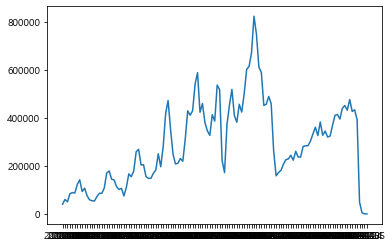

In [ ]:
# X축이 지정할 컬럼과 Y축에 지정할 컬럼을 순서대로 지정한다. 
plt.plot(df_filter['기준년월'], df_filter['관광'])
plt.show()

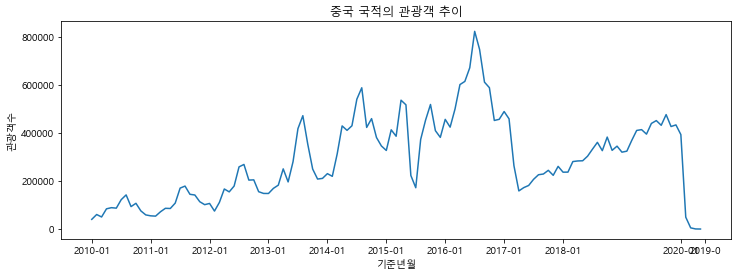

In [ ]:
#그런데 이 그래프에서 X축, Y축의 값이 어떤 내용인지, X축 값들이 너무 많아서 
#알아보기 어렵다. 
#약간 변경해서 보기좋게 바꾼다.
#가로 12인치, 세로 4인치의 그래프를 그린다. 
plt.figure(figsize=(12,4))

#그래프 내용 지정
plt.plot(df_filter['기준년월'], df_filter['관광'])

plt.title('중국 국적의 관광객 추이')
plt.xlabel('기준년월')
plt.ylabel('관광객수')

#그래프에 표시할 X축 눈금 값을 출력한다. 
plt.xticks(['2010-01','2011-01','2012-01','2013-01','2014-01','2015-01',
'2016-01','2017-01','2018-01','2019-0','2020-01'])
plt.show()

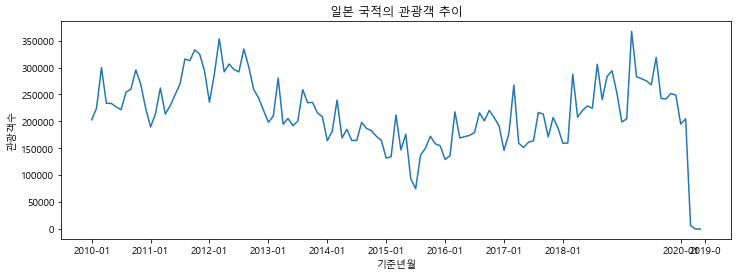

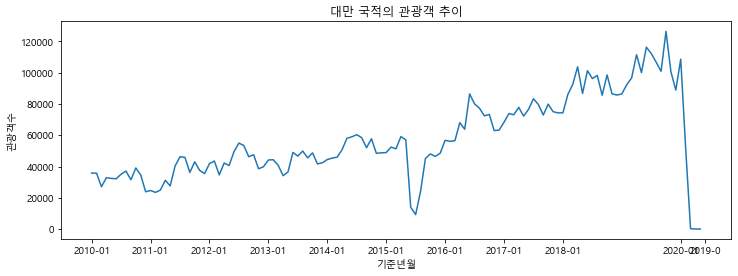

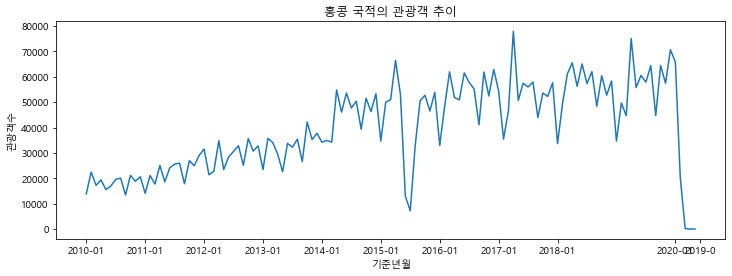

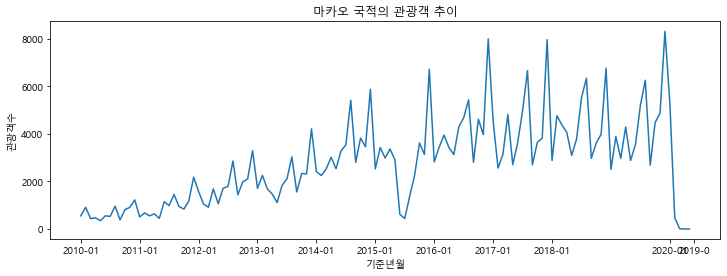

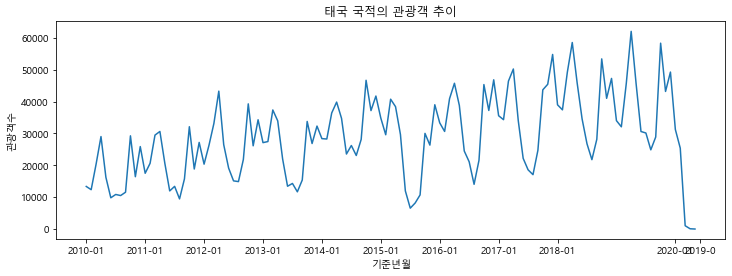

...

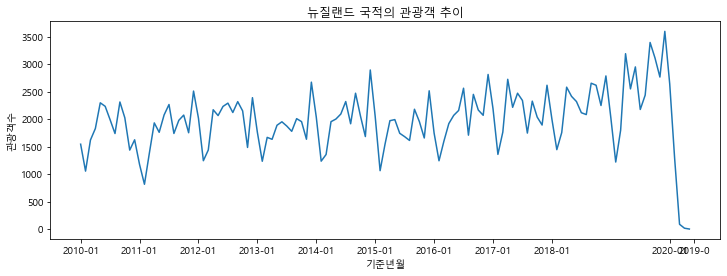

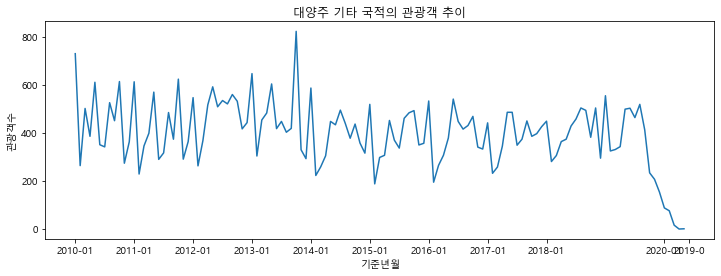

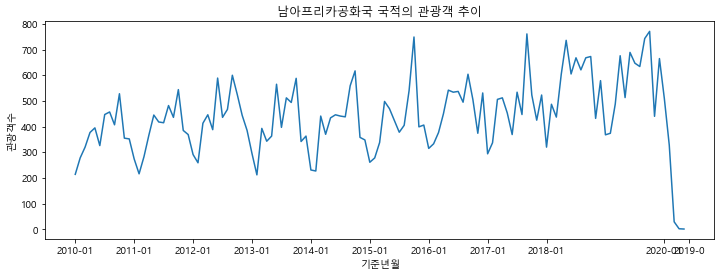

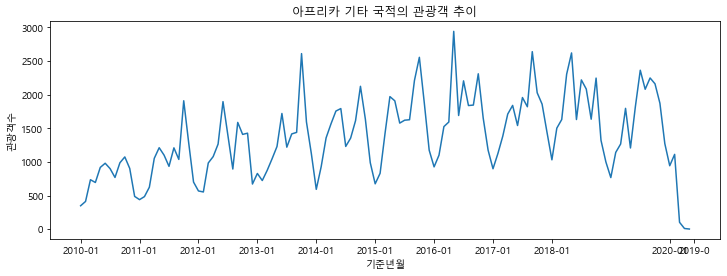

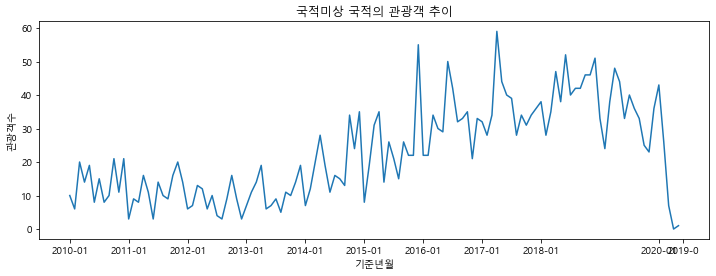

C:\Python38\lib\site-packages\matplotlib\textpath.py:65: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)
C:\Python38\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Python38\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


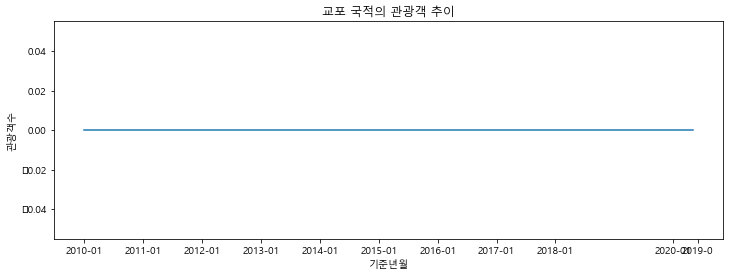

In [ ]:
#반복문으로 여러 그래프 그리기
for cntry in cntry_list:
    #국적 관광객만 추출
    condition = (df['국적'] == cntry)
    df_filter = df[condition]

    plt.figure(figsize=(12,4))

    #그래프 내용 지정
    plt.plot(df_filter['기준년월'], df_filter['관광'])

    plt.title('{} 국적의 관광객 추이'.format(cntry))
    plt.xlabel('기준년월')
    plt.ylabel('관광객수')

    #그래프에 표시할 X축 눈금 값을 출력한다. 
    plt.xticks(['2010-01','2011-01','2012-01','2013-01','2014-01','2015-01',
    '2016-01','2017-01','2018-01','2019-0','2020-01'])
    plt.show()

In [ ]:
#히트맵 그래프 그리기 
#히트맵 그래프는 매트릭스 형태에 포함된 각 값을 칼러로 표현하는 데이터 시각화 방법
df.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%)
0,일본,202825,1750,89,549,3971,209184,2010-01,아시아,97.0,50.6
1,대만,35788,41,17,37,516,36399,2010-01,아시아,98.3,8.9
2,홍콩,13874,55,0,21,595,14545,2010-01,아시아,95.4,3.5
3,마카오,554,0,0,0,0,554,2010-01,아시아,100.0,0.1
4,태국,13374,39,13,53,4335,17814,2010-01,아시아,75.1,3.3


In [ ]:
#앞에서 만든 df에는 기준년월이 하나의 변수로 들어있기 때문에 연도와 월로
#구분된 변수를 만든다.
#일단은 문자열(str)로 변환해서 앞에 4자리(0,4)를 슬라이스 하고 
#다시 5,6번를 슬라이스한다(5,7). 
df['년도'] = df['기준년월'].str.slice(0,4)
df['월'] = df['기준년월'].str.slice(5,7)
df.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%),년도,월
0,일본,202825,1750,89,549,3971,209184,2010-01,아시아,97.0,50.6,2010,01
1,대만,35788,41,17,37,516,36399,2010-01,아시아,98.3,8.9,2010,01
2,홍콩,13874,55,0,21,595,14545,2010-01,아시아,95.4,3.5,2010,01
3,마카오,554,0,0,0,0,554,2010-01,아시아,100.0,0.1,2010,01
4,태국,13374,39,13,53,4335,17814,2010-01,아시아,75.1,3.3,2010,01


In [ ]:
#중국인 관광객 필터링
condition = (df['국적'] == '중국')
df_filter = df[condition]
df_filter.head()

,국적,관광,상용,공용,유학/연수,기타,계,기준년월,대륙,관광객비율(%),전체비율(%),년도,월
17,중국,40425,11930,55,2751,36091,91252,2010-01,아시아,44.3,10.1,2010,01
77,중국,60590,7907,68,29546,42460,140571,2010-02,아시아,43.1,13.6,2010,02
137,중국,50330,13549,174,14924,62480,141457,2010-03,아시아,35.6,9.2,2010,03
197,중국,84252,13306,212,2199,47711,147680,2010-04,아시아,57.1,15.5,2010,04
257,중국,89056,12325,360,2931,49394,154066,2010-05,아시아,57.8,17.0,2010,05


In [ ]:
#매트릭스 형태로 변환한다. 
df_pivot = df_filter.pivot_table(values = '관광',
    index = '년도',
    columns='월')
df_pivot

월,01,02,03,04,05,06,07,08,09,10,11,12
년도,,,,,,,,,,,,
2010,40425.0,60590.0,50330.0,84252.0,89056.0,87080.0,122432.0,142180.0,93545.0,107237.0,75686.0,58987.0
2011,55070.0,53863.0,72003.0,86397.0,85668.0,108060.0,170524.0,178937.0,144704.0,141824.0,113856.0,101605.0
2012,106606.0,74895.0,110965.0,166843.0,154841.0,179074.0,258907.0,268988.0,203857.0,204866.0,155503.0,148320.0
2013,148118.0,169395.0,182850.0,250549.0,196306.0,280319.0,417991.0,472005.0,353359.0,249850.0,208175.0,210950.0
2014,230706.0,219533.0,313400.0,429419.0,410971.0,429991.0,540683.0,588181.0,423133.0,459708.0,381118.0,345957.0
2015,327225.0,413096.0,386386.0,536428.0,517154.0,223101.0,172075.0,372990.0,453670.0,518651.0,409635.0,381722.0
2016,456636.0,424232.0,500018.0,601460.0,614636.0,671493.0,823016.0,747818.0,611538.0,588561.0,452082.0,456882.0
2017,489256.0,458952.0,263788.0,158784.0,172527.0,181507.0,207099.0,226153.0,229172.0,244541.0,223743.0,260983.0
2018,236825.0,237075.0,281020.0,283533.0,284317.0,303405.0,332657.0,360982.0,326438.0,382922.0,327664.0,345135.0


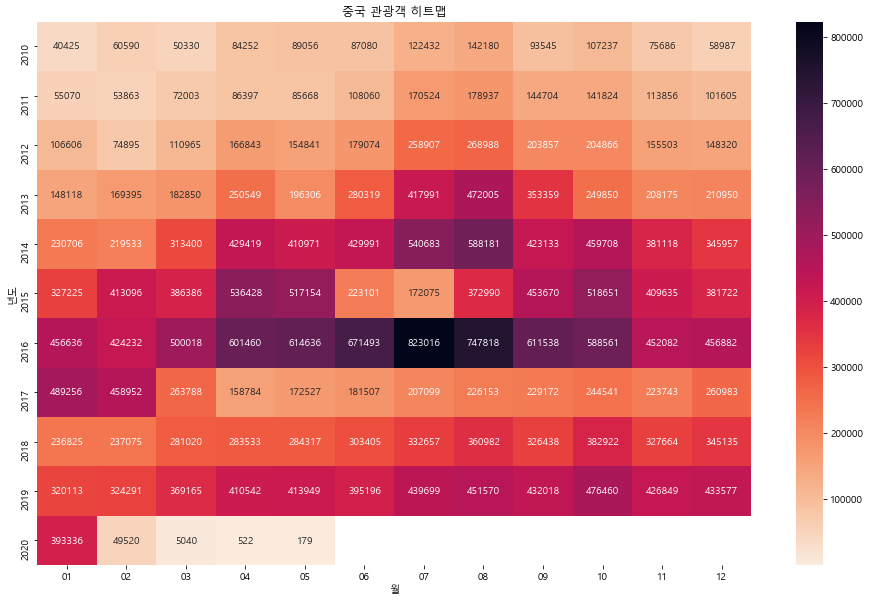

In [ ]:
#히트맵에서 그래프로 표현할 데이터를 만들었다. pivot_table()함수에서 
#index에는 Y축에 표현될 년도를, columns에는 X축에 표현될 월을 입력하고 
#표 내부를 의미하는 values에는 관광객수를 넣었다.
import matplotlib.pyplot as plt 
import seaborn as sns 

plt.figure(figsize=(16,10))

#히트맵 그래프
#(히트맵을 나타낼 데이터를 지정, annot=True는 각 칸에 실제 값을 표시, .0f는 숫자 형태를
# 소수점이 없는 실수형으로 표현, cmap=rocket_r은 그래프의 색깔 조합을 지정한다.)
sns.heatmap(df_pivot, annot=True, fmt='.0f', cmap='rocket_r')
plt.title('중국 관광객 히트맵')
plt.show()


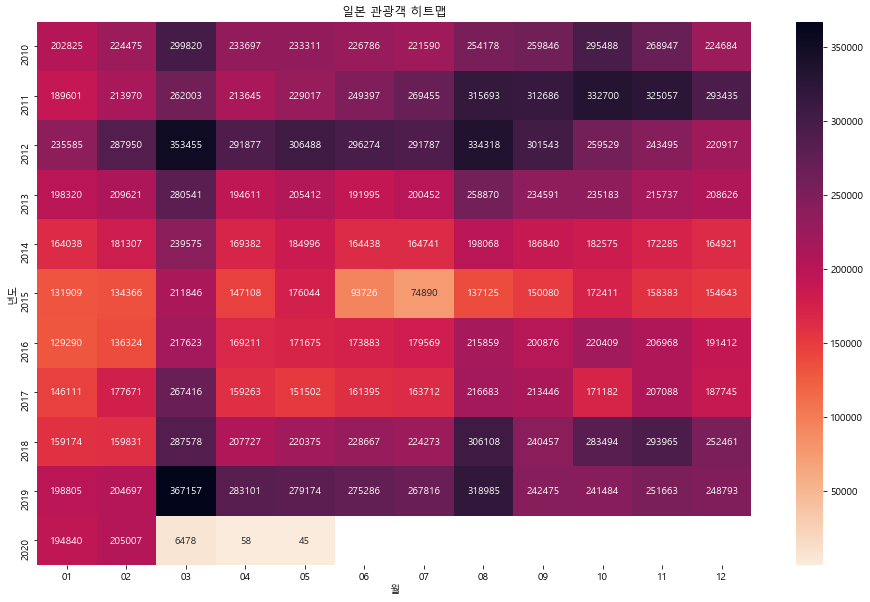

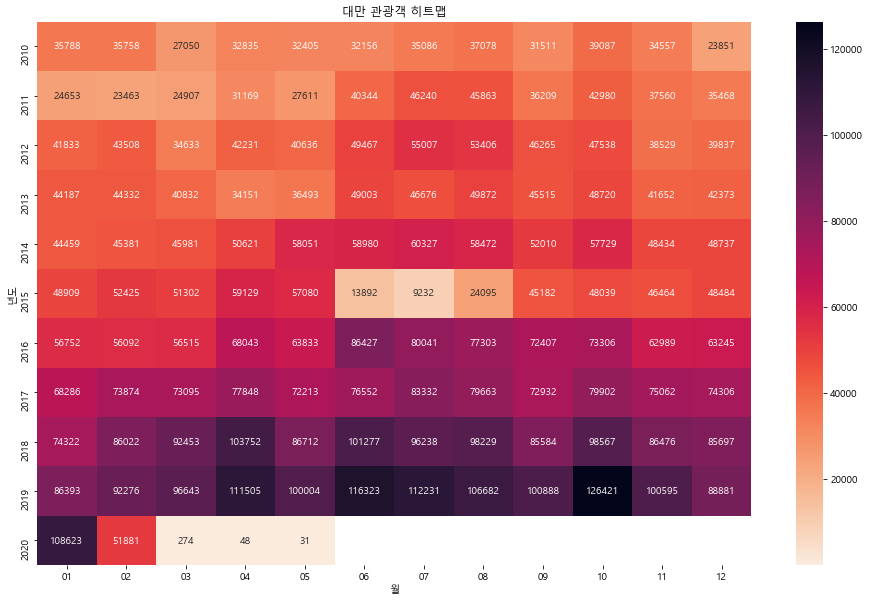

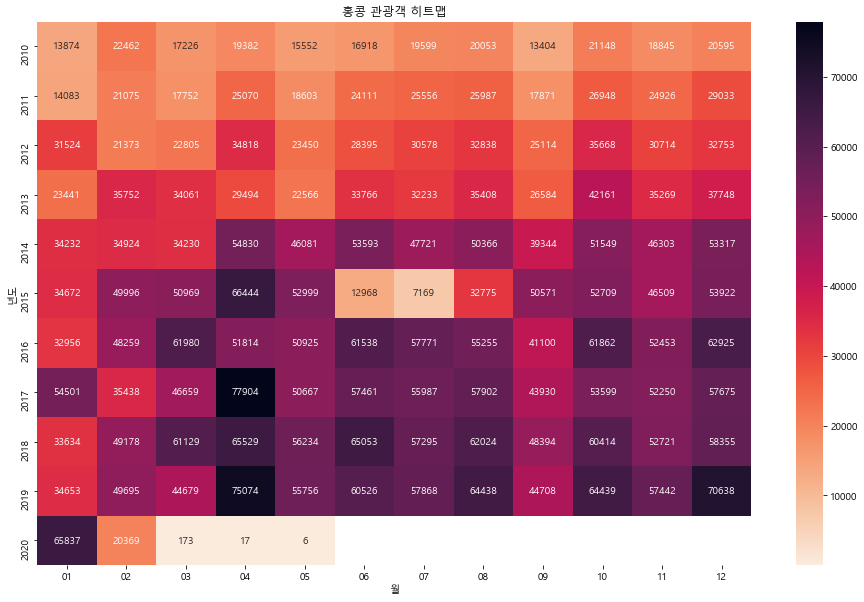

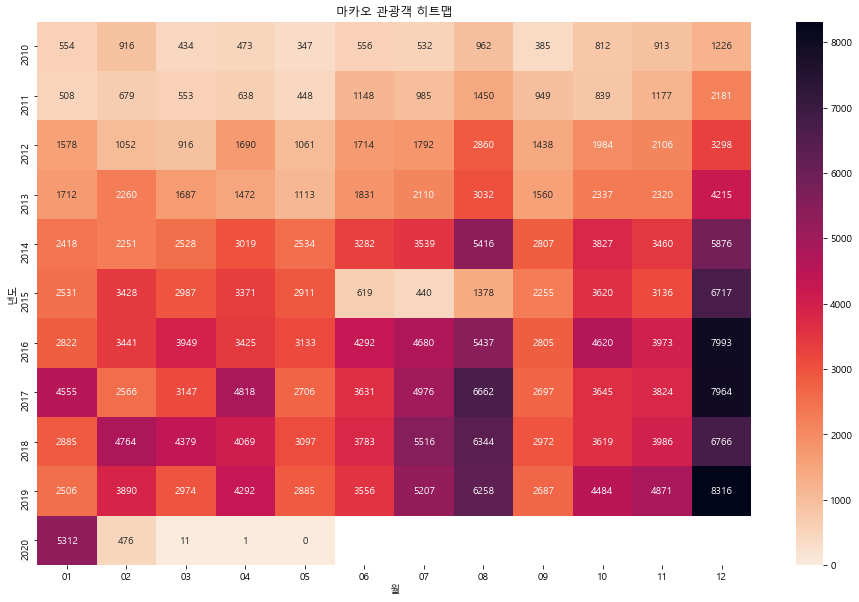

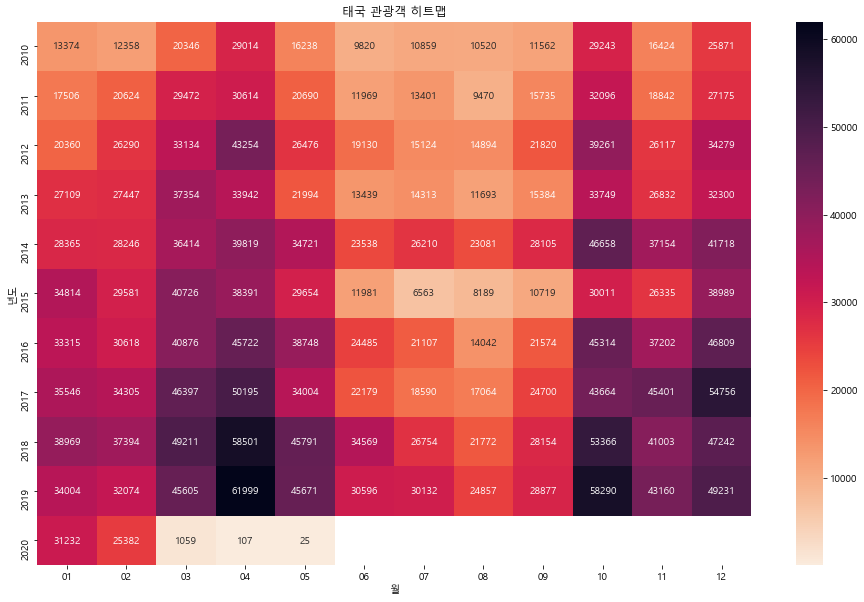

...

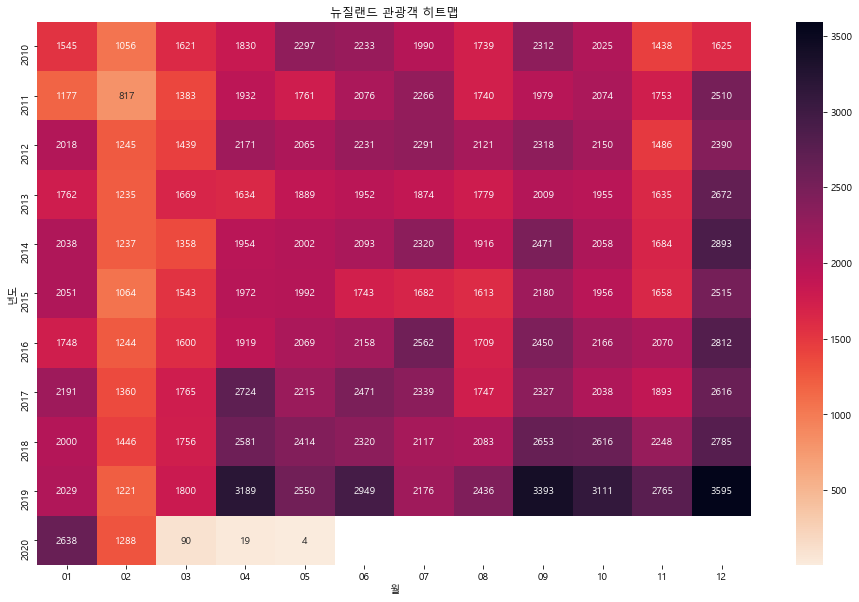

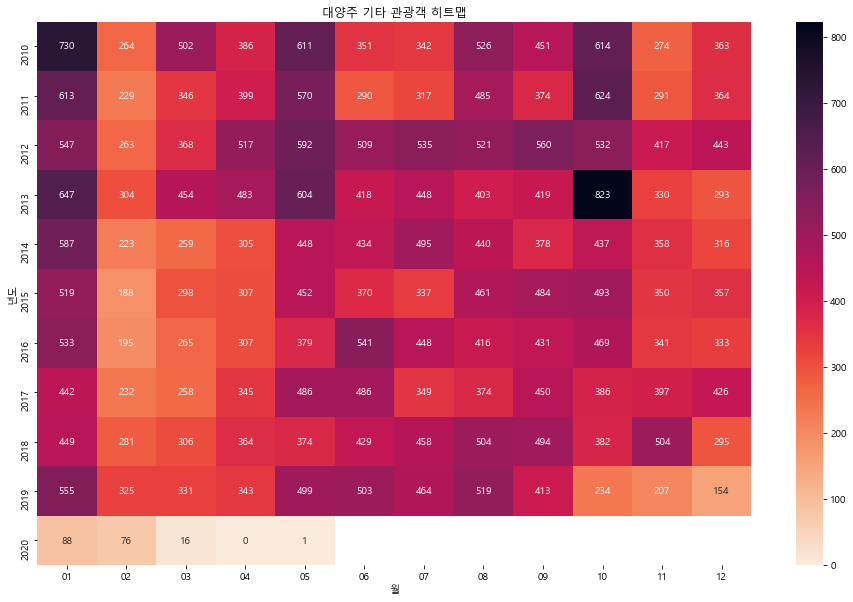

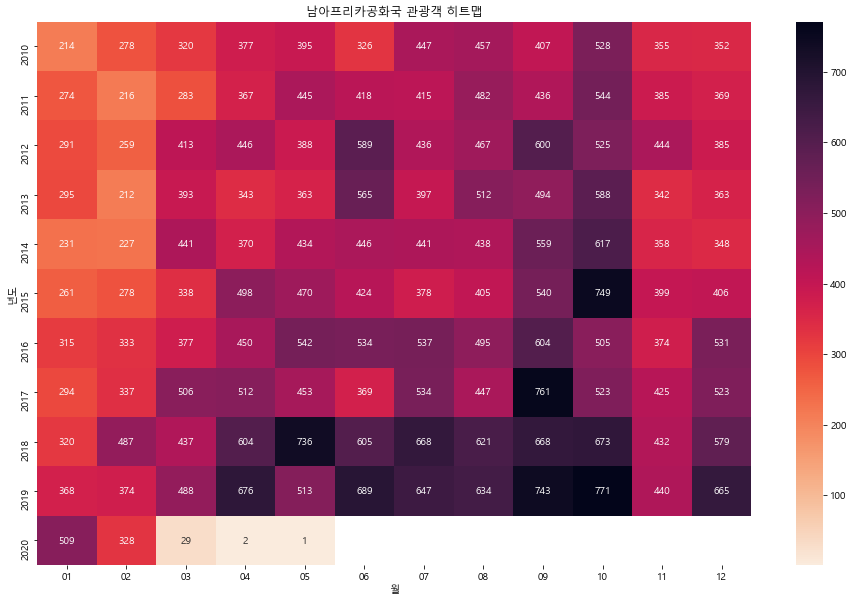

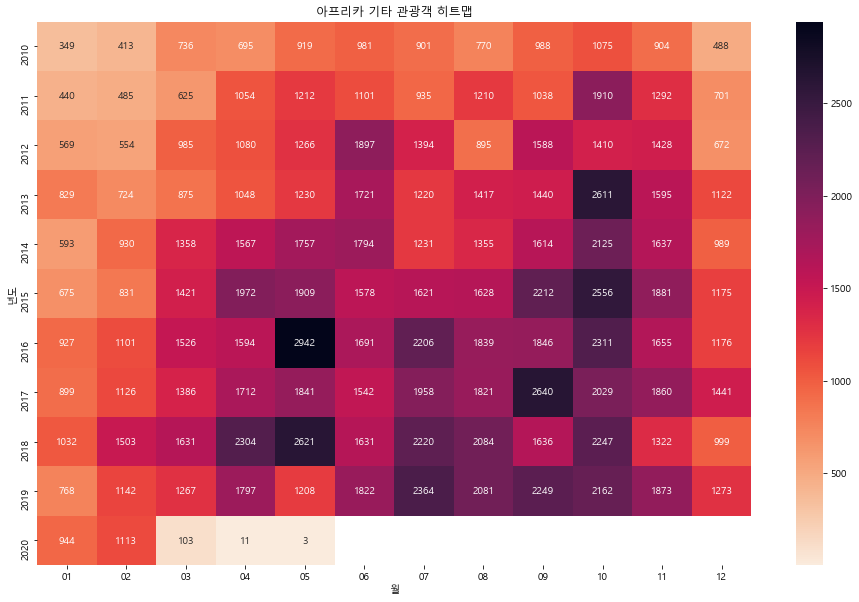

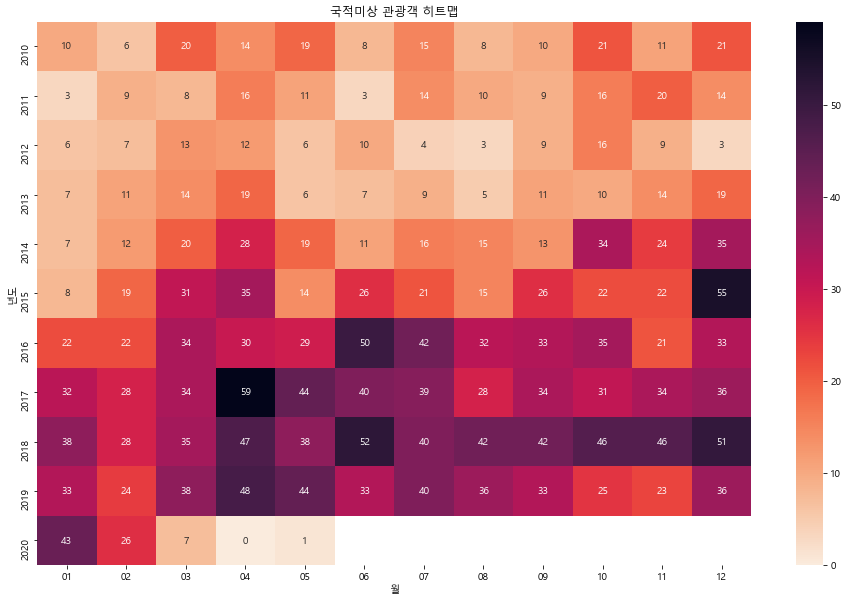

C:\Python38\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Python38\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)
C:\Python38\lib\site-packages\matplotlib\textpath.py:65: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)


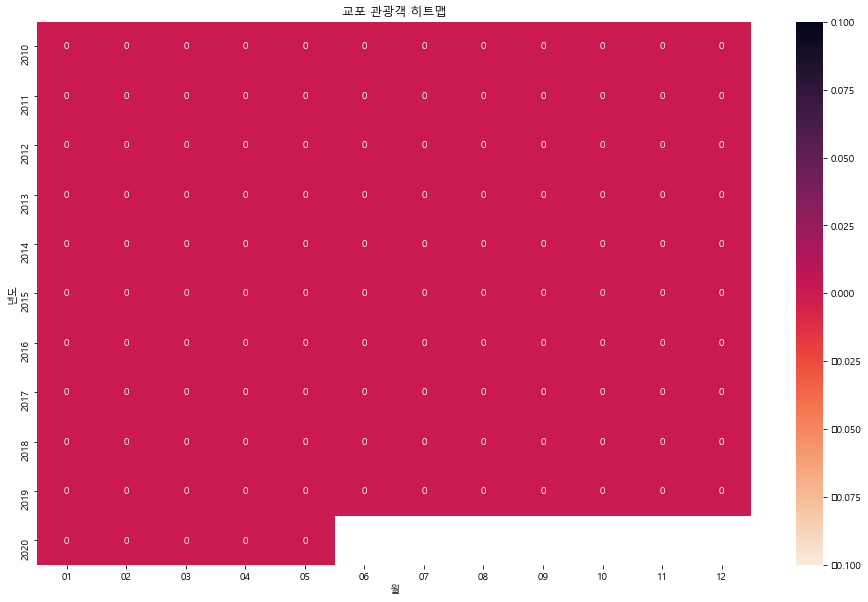

In [ ]:
#반복문으로 상위 5개국에 대한 히트맵 그래프 그리기 
for cntry in cntry_list:
    condition = (df['국적'] == cntry)
    df_filter = df[condition]

    df_pivot = df_filter.pivot_table(values = '관광',
        index = '년도',
        columns = '월')
    plt.figure(figsize = (16,10))
    sns.heatmap(df_pivot, annot=True, fmt='.0f', cmap='rocket_r')
    plt.title('{} 관광객 히트맵'.format(cntry))
    plt.show()